In [1]:
# Necessary imports
import numpy as np
import matplotlib.pyplot as plt

In [2]:
np.random.seed(5)

In [13]:
# Parameters
n_paths = 100      # Track 5 paths
n_steps = 1000   # 1000 time steps
t_max = 1        # max time 1
dt = t_max / n_steps  # time step size

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


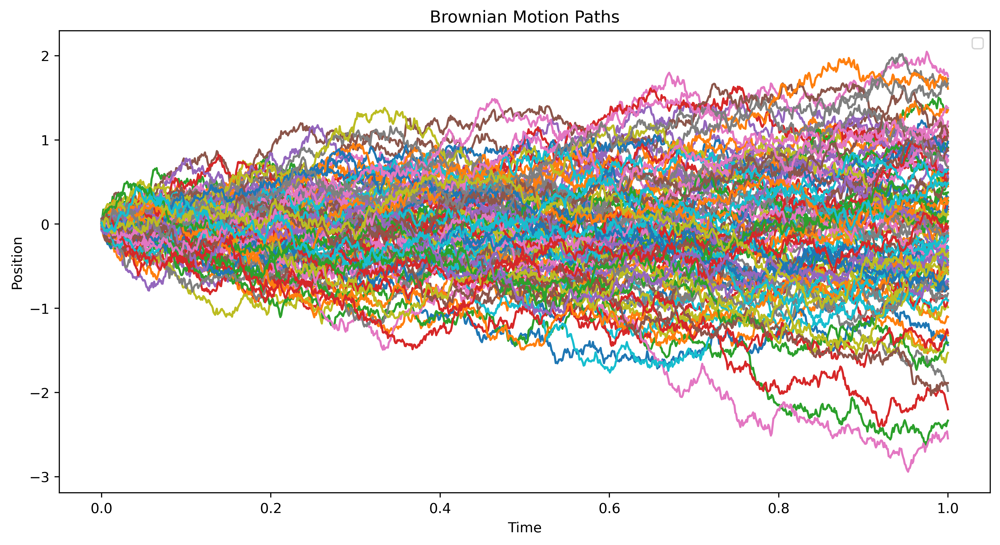

In [14]:
# Generating Brownian motion paths
t = np.linspace(0, t_max, n_steps)
paths = np.cumsum(np.sqrt(dt) * np.random.randn(n_paths, n_steps), axis=1)

# Plotting the paths
plt.figure(figsize=(12, 6), dpi=400)
for i in range(n_paths):
    plt.plot(t, paths[i],)
plt.title('Brownian Motion Paths')
plt.xlabel('Time')
plt.ylabel('Position')
plt.legend()
plt.show()


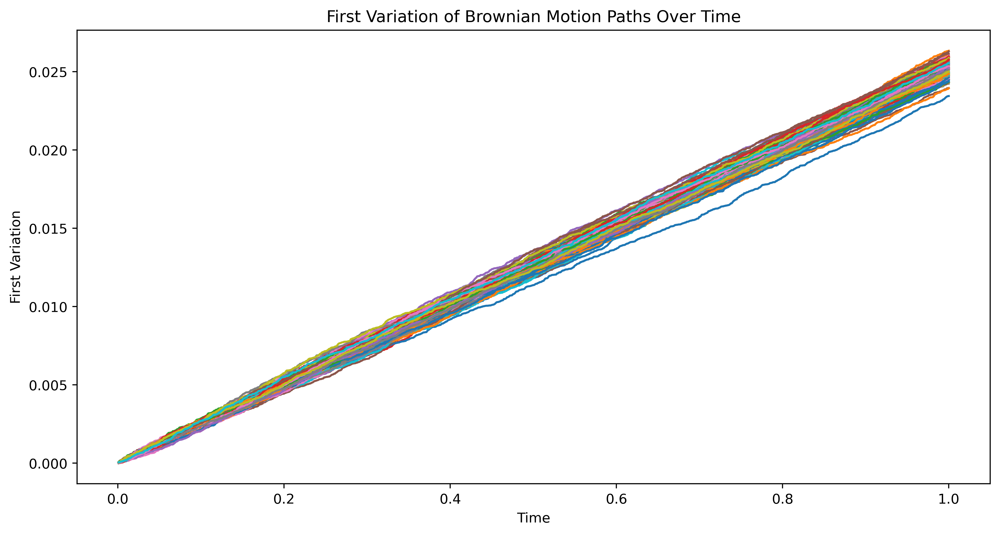

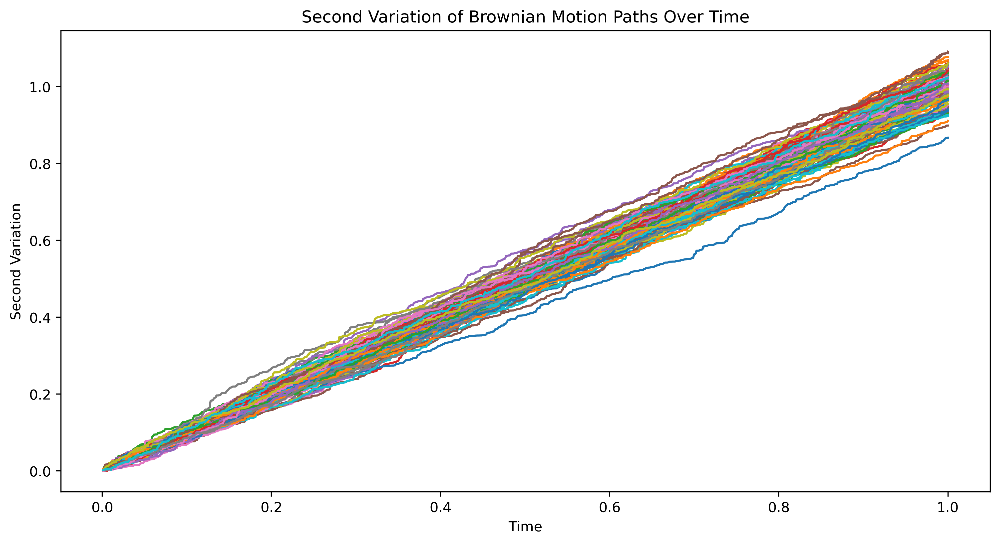

In [17]:
# First variation of Brownian motion
# Second variation of Brownian motion
first_variation_time = np.cumsum(np.abs(np.diff(paths, axis=1)), axis=1) * dt
second_variation_time = np.cumsum(np.diff(paths, axis=1)**2, axis=1)

# Plotting the first variation of Brownian motion
plt.figure(figsize=(12, 6), dpi=400)
for i in range(n_paths):
    # plt.plot(t[1:], first_variation_time[i], label=f'Path {i+1}')
    plt.plot(t[1:], first_variation_time[i])
plt.title('First Variation of Brownian Motion Paths Over Time')
plt.xlabel('Time')
plt.ylabel('First Variation')
# plt.legend()
plt.show()

# Plotting the second variation of Brownian motion
plt.figure(figsize=(12, 6), dpi=400)
for i in range(n_paths):
    # plt.plot(t[1:], second_variation_time[i], label=f'Path {i+1}')
    plt.plot(t[1:], second_variation_time[i])
plt.title('Second Variation of Brownian Motion Paths Over Time')
plt.xlabel('Time')
plt.ylabel('Second Variation')
# plt.legend()
plt.show()



In [48]:
# 参数设置
n_paths = 5     # 轨道数量
n_steps = 1000  # 时间步数
t_max = 100       # 最大时间
dt = t_max / n_steps  # 时间步长
# dt = 1  # 时间步长
alpha, v, sigma, x0 = 0.5, 5.0, 0.5, 5.0  # α, v, σ, x0

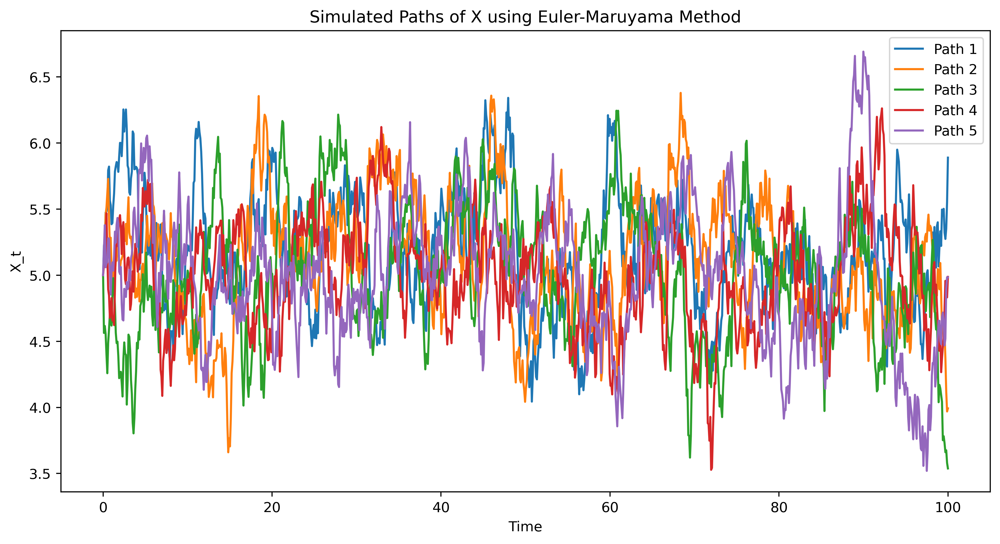

In [49]:
# 时间数组
t = np.linspace(0, t_max, n_steps)

# 初始化X的轨道
X_paths = np.zeros((n_paths, n_steps))
X_paths[:, 0] = x0

# 使用 Euler-Maruyama 方法生成X的轨道
for i in range(1, n_steps):
    epsilon_t = np.random.randn(n_paths)  # 从标准正态分布抽取
    X_paths[:, i] = X_paths[:, i - 1] + alpha * (v - X_paths[:, i - 1]) * dt + sigma * np.sqrt(dt) * epsilon_t

# 绘制X的轨道
plt.figure(figsize=(12, 6), dpi=400)
for i in range(n_paths):
    plt.plot(t, X_paths[i], label=f'Path {i+1}')
plt.title('Simulated Paths of X using Euler-Maruyama Method')
plt.xlabel('Time')
plt.ylabel('X_t')
plt.legend()
plt.show()

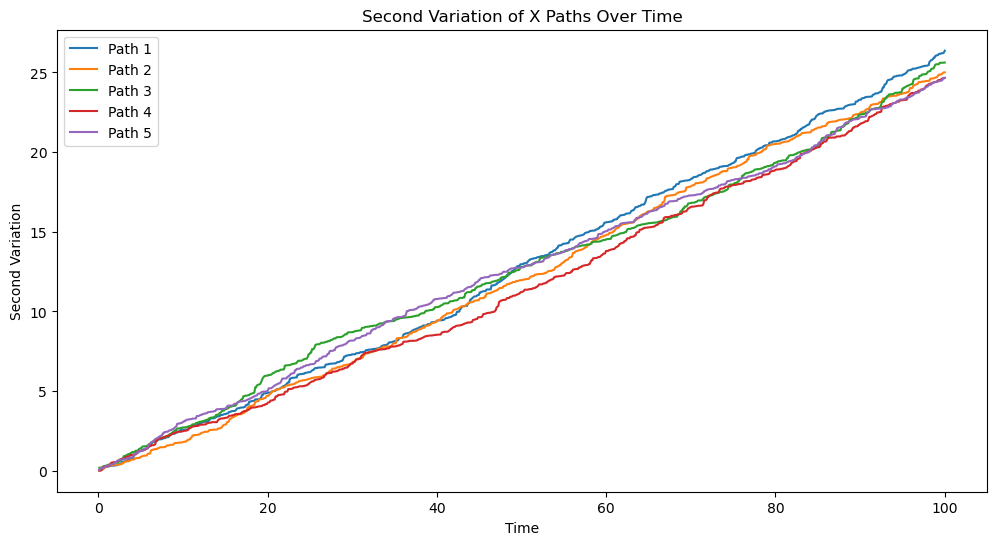

In [50]:
# 计算X轨道的二阶变差
second_variation_X = np.cumsum(np.diff(X_paths, axis=1)**2, axis=1)

# 绘制X轨道的二阶变差
plt.figure(figsize=(12, 6),dpi=400)
for i in range(n_paths):
    plt.plot(t[1:], second_variation_X[i], label=f'Path {i+1}')
plt.title('Second Variation of X Paths Over Time')
plt.xlabel('Time')
plt.ylabel('Second Variation')
plt.legend()
plt.show()

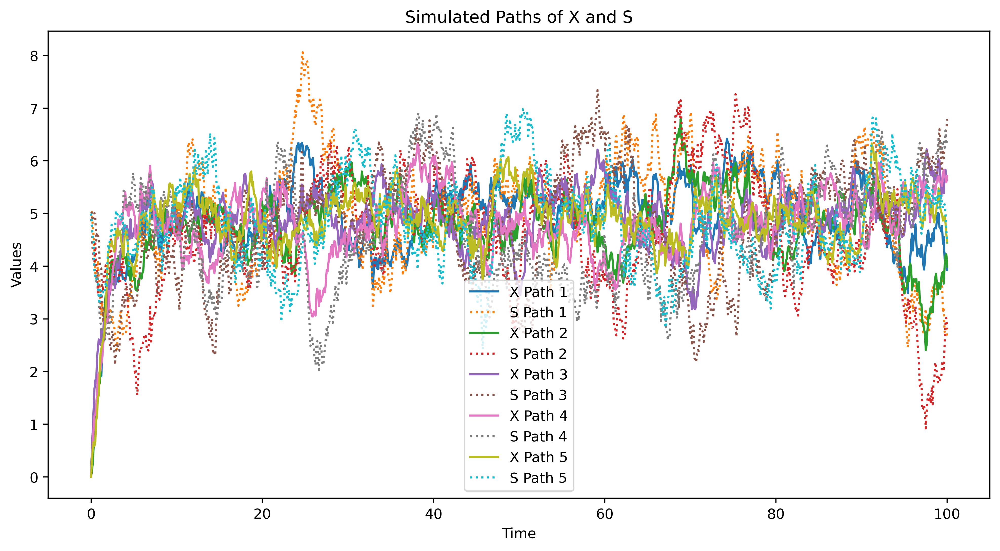

In [84]:
import numpy as np
import matplotlib.pyplot as plt

# 参数设置
n_paths = 5     # 轨道数量
n_steps = 1000  # 时间步数
t_max = 100       # 最大时间
dt = t_max / n_steps  # 时间步长
alpha, v, sigma = 0.5, 5, 0.5  # α, v, σ
theta, sigma1, sigma2, x0, s0 = 0.5, 0.5, 0.5, 0, 5  # θ, σ1, σ2, x0, s0

# 时间数组
t = np.linspace(0, t_max, n_steps)

# 初始化X和S的轨道
X_paths = np.zeros((n_paths, n_steps))
S_paths = np.zeros((n_paths, n_steps))
X_paths[:, 0] = x0
S_paths[:, 0] = s0

# 使用 Euler-Maruyama 方法生成X和S的轨道
for i in range(1, n_steps):
    dBt = np.random.randn(n_paths) * np.sqrt(dt)
    dWt = np.random.randn(n_paths) * np.sqrt(dt)
    X_paths[:, i] = X_paths[:, i - 1] + alpha * (v - X_paths[:, i - 1]) * dt + sigma * dBt
    S_paths[:, i] = S_paths[:, i - 1] + theta * (X_paths[:, i - 1] - S_paths[:, i - 1]) * dt + sigma1 * dBt + sigma2 * dWt

# 绘制X和S的轨道
plt.figure(figsize=(12, 6), dpi=400)
for i in range(n_paths):
    plt.plot(t, X_paths[i], label=f'X Path {i+1}')
    plt.plot(t, S_paths[i], label=f'S Path {i+1}', linestyle=':')
plt.title('Simulated Paths of X and S')
plt.xlabel('Time')
plt.ylabel('Values')
plt.legend()
plt.show()


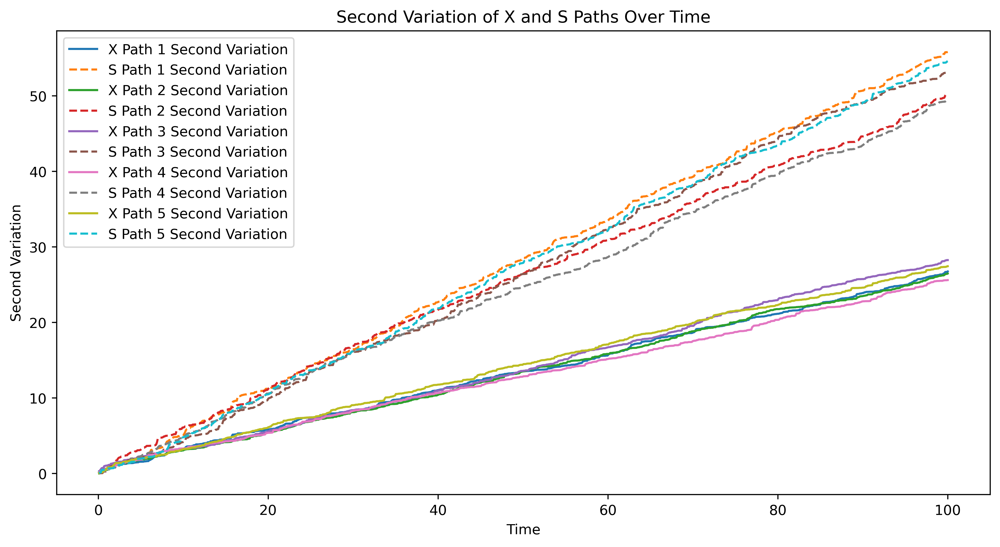

In [85]:
# 计算X和S轨道的二阶变差
second_variation_X = np.cumsum(np.diff(X_paths, axis=1)**2, axis=1)
second_variation_S = np.cumsum(np.diff(S_paths, axis=1)**2, axis=1)

# 绘制X和S轨道的二阶变差
plt.figure(figsize=(12, 6), dpi=400)
for i in range(n_paths):
    plt.plot(t[1:], second_variation_X[i], label=f'X Path {i+1} Second Variation')
    plt.plot(t[1:], second_variation_S[i], label=f'S Path {i+1} Second Variation', linestyle='--')
plt.title('Second Variation of X and S Paths Over Time')
plt.xlabel('Time')
plt.ylabel('Second Variation')
plt.legend()
plt.show()
